
**Remark: please answer each question in its own cell.**

On Quercus, submit both a PDF printout of your assignment (for easier grading) and the ipynb file.

# **Sentiment Analysis Using Gated-Recurrent Neural Networks**

In this assignment, we will use the IMDB dataset that contains the text of 50,000 movie reviews from the Internet Movie Database (IMDB) website. The label of each movie review is either positive or negative. An example of the input-output pair in this dataset is

"*I happen to run into this movie one night so I decided to watch it ! I was very pleased with the movie ... I thought it was a wonderful plot . It 's a great feeling knowing a deceased one has come back and you get that second chance to say what you want to say ! And this wife stayed devoted for 23 years ! ! ! I thought it was a great movie ! !*"

where its label, as you might expect, is 
"*positive*".

**In this assignment, we want to design a classifier that takes as input a review and outputs whether it is a positive or negative review about a movie.**

In the next two cells, we import some modules and also fix some constants for our implementation. 

In [ ]:
import csv
from typing import Callable, Tuple

import jax.numpy as jn
import matplotlib.pyplot as plt
import numpy as np
from jax import lax
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from tqdm import trange
from sklearn.model_selection import train_test_split
%pip --quiet install objax
import objax
from objax.typing import JaxArray


objax.random.DEFAULT_GENERATOR.seed(42)
np.random.seed(42)

     |████████████████████████████████| 50 kB 4.9 MB/s 


In [ ]:
!gdown --id 11r58MB8wRBO1o1gEC-zxiADZIuwMnhf7

Downloading...
From: https://drive.google.com/uc?id=11r58MB8wRBO1o1gEC-zxiADZIuwMnhf7
To: /content/IMDB Dataset.csv
100% 66.2M/66.2M [00:00<00:00, 160MB/s] 


In [ ]:
max_vocab = 2000  # this parameter is for the maximum number of words in the "dictionary"
max_len = 200  # maximum length of each review
embedding_size = 30  # size of embedding
num_hidden_units_GRU = 30  # GRU cells in the RNN layer
num_hidden_units = 60  # hidden unit of dense network after GRU

vocab_size = max_vocab
filename = 'IMDB Dataset.csv'

# How to find a representation of sentences?
In order to put the words into the machine learning algorithm the text data should be converted into a vector representation. The first approach that comes to mind is *one hot encoding*.
 # One Hot Encoding
Assume that we count the number of english words in the Merriam-Webster dictionary, and it turns out that the total number of words is $N$. Then, a possible way to represent the words is to use binary vectors of size $N$. Each integer value is represented as a binary vector that is all zero values except the index of the integer, which is marked with a $1$.
As an example let's say all the words in the dictionary consists of $\{$apple, orange, Milan,Rome$\}$. For this example, the one hot encoding is given by:
 
apple = $[1,0,0,0]$ \\
orange = $[0,1,0,0]$ \\
Milan = $[0,0,1,0]$  \\
Rome = $[0,0,0,1]$
 
We can also represent each word by an integer: for instance in the above-mentioned example, the mapping is apple $\rightarrow$ 1, orange $\rightarrow$ 2, Milan $\rightarrow$ 3,  Rome $\rightarrow$ 4.
 



When we are working with a dataset, a practical approach for one-hot encoding of the data is as follows:
 
1.  First, we can create a dictionary which shows each word along with its frequency in the dataset. For example, if the sentence is "Put the books on the table." , we need to create a dictionary such that word_index["Put"] = 1; word_index["the"] = 2; word_index["books"] = 1; word_index["on"] = 1; word_index["table"] = 1.
2.  Second, based on the maximum size of the vocabulary we want, we can sort the words based on their frequency and only pick the most frequent words of this maximum size of the vocabulary, and this creates our dictionary. So lower integer means more frequent word (often the first few are stop words because they appear a lot)
 
3. Then, we can assign an integer to each word in the dictionary, and represent each sentence as a sequence of integers.
 
 
The following function performs the above-mentioned steps for our IMDB dataset.



In [ ]:
def data_processing(filename, max_vocab, max_len):
  # filename: the name of the .csv file
  # max_vocab: The maximum number of words
  # max_len: 
  messages = []  # a list contains the reviews
  labels = []  # a list contains the labels
  with open(filename, 'r') as file:
      reader = csv.reader(file)
      firstline = True
      for row in reader:
        if firstline:
            firstline = False
            continue
        else:
            messages.append(row[0])
            labels.append(int(row[1]=='positive'))

  tokenizer = Tokenizer(num_words=max_vocab)
  tokenizer.fit_on_texts(messages)
  messages_seq = tokenizer.texts_to_sequences(messages)
  data = pad_sequences(messages_seq, maxlen=max_len) 
  train_size = 0.8
  messages_train, messages_valid_test, labels_train, labels_valid_test  = train_test_split(data, labels, train_size=train_size)
  messages_valid, messages_test, labels_valid, labels_test  = train_test_split(messages_valid_test, labels_valid_test, train_size=0.5)
  return np.array(messages_train), np.array(labels_train), np.array(messages_valid), np.array(labels_valid), np.array(messages_test), np.array(labels_test)

For the data_processing function, we used Tokenizer which is a class in keras.preprocessing.text. The following questions are about the different methods in this class. \\



**Question 1** [1 points]: In your own words, explain what does "fit_on_texts" do? \\

In [ ]:
messages = []  # a list contains the reviews
labels = []  # a list contains the labels
with open(filename, 'r') as file:
    reader = csv.reader(file)
    firstline = True
    for row in reader:
      if firstline:
          firstline = False
          continue
      else:
          messages.append(row[0])
          labels.append(int(row[1]=='positive'))

tokenizer = Tokenizer(num_words=max_vocab)
tokenizer.fit_on_texts(messages)
tokenizer.get_config()

{'char_level': False,
 'document_count': 50000,
 'filters': '!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',
 'index_docs': '{"32": 24302, "356": 3161, "2468": 357, "48": 19205, "210": 5465, "134": 7879, "23": 27611, "344": 3046, "16740": 25, "60": 14901, "1320": 753, "3024": 285, "391": 2776, "7889": 73, "189": 5867, "920": 1075, "12": 39898, "4910": 147, "954": 1152, "8697": 71, "474": 2320, "5510": 134, "22": 25950, "68": 14637, "19395": 19, "2": 48301, "9": 42564, "693": 1644, "25422": 12, "398": 1885, "651": 1720, "3184": 168, "10": 38495, "43": 21618, "4103": 202, "54": 16216, "7888": 83, "2523": 352, "1208": 628, "8": 44011, "2453": 289, "7154": 89, "413": 2749, "1324": 778, "433": 2615, "1280": 810, "2595": 364, "139": 8130, "1443": 706, "79": 13323, "56309": 2, "661": 1685, "7017": 99, "39": 20981, "183": 5954, "21": 29773, "15115": 31, "5398": 135, "15701": 25, "1479": 573, "276": 3870, "27": 28305, "621": 1811, "7": 29202, "1592": 651, "34": 23309, "287": 4000, "2150": 427, "642": 17

**"fit_on_texts" is part of the Keras tokenizer class. It is used to build the vocabulary for the texts list. It does this in the manner outlined above.**

**Specifically (paraphrased from this doc and keras documentation):**

**"Based on the maximum size of the vocabulary we want, we can sort the words based on their frequency and only pick the most frequent words that satisfy this maximum bound on vocabulary size. Here, our vocab size is 2000, so we select the 2000 most frequent words across all documents(reviews) as part of our vocabulary. This creates our dictionary. So, word_index being a lower integer means the corresponding word appears more frequently across all reviews. Often, the first few are stop words because they appear a lot in the English language.**

**By assigning an integer to each word in the dictionary, we can then represent each sentence as a sequence of integers.". This is done by the function texts_to_sequences, but made possible by this method, which fits a dictionary to the set of reviews**

**The code block above prints the word indices. We can verify its correctness since stop words have lowest indices.** 

**The fit_on_text methods also returns other useful information. These include 
word_counts : dictionary telling us count of each word;
word_docs : dictionary telling us how many documents contain each word; and
document_count: total number of documents used in fitting tokenizer**

**Question 2** [1 points]: In your own words, explain what does "texts_to_sequences" do? \\

In [ ]:
messages = []  # a list contains the reviews
labels = []  # a list contains the labels
with open(filename, 'r') as file:
    reader = csv.reader(file)
    firstline = True 
    for row in reader:
      if firstline:
          firstline = False
          continue
      else:
          messages.append(row[0])
          labels.append(int(row[1]=='positive'))

tokenizer = Tokenizer(num_words=max_vocab)
tokenizer.fit_on_texts(messages)
messages_seq = tokenizer.texts_to_sequences(messages)
print(messages_seq[0])

[27, 4, 1, 79, 45, 1072, 12, 100, 147, 39, 307, 398, 474, 26, 33, 23, 203, 14, 11, 6, 621, 48, 596, 16, 68, 7, 7, 1, 86, 148, 12, 68, 42, 13, 92, 2, 134, 4, 570, 60, 268, 8, 203, 36, 1, 661, 139, 1740, 68, 11, 6, 21, 3, 119, 15, 1, 38, 11, 119, 54, 16, 5, 1479, 376, 38, 570, 92, 6, 8, 1, 360, 356, 4, 1, 661, 7, 7, 9, 6, 433, 14, 12, 6, 1, 358, 5, 1, 1064, 9, 1421, 20, 538, 32, 4, 1, 1208, 117, 29, 1, 25, 2, 391, 34, 6, 21, 299, 20, 1, 538, 6, 344, 5, 106, 2, 51, 34, 327, 2, 23, 110, 225, 243, 7, 7, 10, 58, 131, 1, 280, 1324, 4, 1, 119, 6, 693, 5, 1, 192, 12, 9, 269, 117, 79, 276, 589, 834, 180, 1320, 15, 1243, 834, 1443, 834, 887, 149, 954, 183, 1, 86, 398, 10, 123, 210, 68, 14, 34, 1637, 9, 13, 10, 413, 131, 10, 13, 1592, 15, 9, 18, 14, 10, 287, 51, 10, 1417, 3, 1280, 15, 2, 189, 5, 1, 299, 4, 570, 21, 39, 570, 18, 26, 41, 15, 3, 504, 20, 642, 2, 76, 243, 16, 9, 69, 651, 710, 109, 662, 82, 1208, 693, 5, 65, 574, 4, 920, 38, 1208, 559, 147, 22, 200, 426, 16, 48, 6, 805, 1603, 43, 22, 6

**"texts_to_sequences" transforms each text(string) in the "messages" list to a sequence of integers, and returns as a new list. So, its input is a list of text strings, and its output is a list of sequences. It does this by replacing each word by its appropriate integer word index, as specified in tokenizer.word_index**

**Only top max_vocab-1 most frequent words will be taken into account.**

**Example**

**Let's say our list of texts has just one text: "My name is Hshmat", and lets say in out vocabulary, word_index("My")=1, word_index("name")=2, word_index("is")=3, word_index("Hshmat")=4.**

**Then: texts_to_sequences(\["My name is Hshmat"\]) = \[[1, 2, 3, 4\]]**

**Question 3** [1 points]: In your own words, explain what does "pad_sequences" do, and why do we need it? \\

**LSTM neural network architectures require inputs to have same size. In the first two steps of our preprocessing: creating the vocabulary and converting texts to sequences, we end up with inputs as sequences of integers, not necessarily of the same size. So, the next step in our processing is to make inputs the same size by padding 0s to sequences with length < max_len, and dropping elements in sequences with length > max_len.**

**This ensures we can use the same neural network architecture for all inputs, since they all have the same shape.**

**By the default implementation of keras pad_sequences method, padding="pre" and truncating="pre". This means 0s will be added to the beginning of sequences for short sentences; and elements will be removed from sentences from the beginning of the sentence if its length exceeds max_len=200**

In the next cell, we encode the data set using one-hot encoding, and split the dataset into the training set, validation set, and the test test.

In [ ]:
messages_train, labels_train, messages_valid, labels_valid, messages_test, labels_test = data_processing(filename, max_vocab, max_len)

**Question 4** [1 points]: Print one of the input in the training set and explain your observation? Does it match with what you expected?

In [ ]:
# This will output representation of one sentence 
print(messages_train[5])
print(len(messages_train[5]))

[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0   10   89  118   85   11   17   34  106 1161  838   20
   11  145    3  191  326    2  235   52 1077   16    1   64   11  212
   19  671   18   57   43   10  292    1  333  113   52  333 1053 1947
   14    1  513    2   29  183    1  335    2 1407 1268  490   11 1184
 1712  296   41   85 1031   12  347   13   43   22  339   12    2  190
   12   13 1059  721 1075    9  239   13    1   88  152  173    4    1
   17  273  474   37   11   17   18   43  337    3  326   38   21  335
   89 

**This matches what I expected. It is a sequence of integers, padded with 0s at the beginning since number of words in that sequence is less than max_len=200.**

**Furthermore, len(messages_train[5]) = 200, so it satisfies the constraint that all inputs must have length 200**

**Lastly, by visually observing matrix of numbers, the numbers I see most (aside from 0) are 1,2,3 and 4. This makes sense because words assigned to these smaller numbers were specifically assigned to smaller numbers because they appear most freqeuntly throughout the reviews.**

# Embedding Layer



Imagine that we have 80,000 unique words in a text classification problem and we select to preprocess the text as explained above. For instance, a sentence "i love you" or ['i', 'love', 'you'] can be shown as a matrix of size (3 , 80000) where its elements is all zeros except from 3 elements that correspond to those words. In the case that we want to extract the feature using recurrent neural netowk, the input size should be the size of $80,000$ in which only three entries are non-zero!

Instead, we can use the observation that since our goal is to extract feature from a sentence, we might be able to construct a mapping so that the words whose meanings are similar map to the same vector. One possible approach to do this is to perform this maaping using a simple matrix multiplication that transforms words into their corresponding word embeddings or turns positive integers (indexes) into dense vectors of fixed size, where the size of embedding $\ll$ size of the vocabualry. 

Please watch this short video to gain better understanding of the embedding layer:


https://www.coursera.org/lecture/nlp-sequence-models/learning-word-embeddings-APM5s


Since Objax does not have embedding layer module in it, we need to write our own module. One implementaiton of the embedding layer is as follows. 

In [ ]:
class Embed(objax.Module):
    def __init__(self, size: int, latent: int, init: Callable = objax.nn.init.xavier_truncated_normal):
        self.w = objax.TrainVar(init((size, latent)))

    def __call__(self, x: JaxArray) -> JaxArray:
        return self.w.value[x]

**Question 5: [1 points]**  Briefly explain how `__init__` and `__call__` functions work when the input is a sentence?

**"\__init\__" function works by initializing a size\*latent matrix, where size = number of words in vocab = 2000, and latent = embedding_size = 30. This corresponds to a 2000*30 matrix, where each row k is the embedding of word k in our vocabulary**

**"\__call\__" works by converting a word or sentence to its embedding. It does this through the line self.w.value\[x\], which extracts rows of w specified by elements in x. So, if we wanted to extract embedding for one word, we would just pass the index of the word in our vocabulary. If we want the embedding of a sentence, we pass in the sequence corresponding to that sentence. This will be a list of 200 integers. self.w.value\[x\] will then return a 200*30 matrix by extracting the 200 rows in w that correspond to the words of our sentence, as given by list of word indices: x.**

# Gated Recurrent Unit Cell
GRUs are a family of the recurrent neural networks used for processing of the sequential data. In this assignment, we want to use GRU for the sentiment analysis.

The forward pass of a Gated Recurrent Unit is defined by the following equations:




1.   $z_t = \text{sigmoid} (W_z x_t + U_z h_{t-1} + b_z)$
2.   $r_t = \text{sigmoid} (W_r x_t + U_r h_{t-1} + b_r)$
3.   $\hat{h}_t = \text{tanh} (W_h x_t + U_h (r_t \odot h_{t-1}) + b_h)$
4.   $h_t =  (1-z_t)\odot h_{t-1} + z_t \odot \hat{h}_t$

where
the operator ${\displaystyle \odot }$  denotes the Hadamard product, and 

*  $x_{t}$: input vector
*   $h_{t}$: output vector
* ${\hat {h}}_{t}$: candidate activation vector
* $z_{t}$: update gate vector
* $r_{t}$: reset gate vector
* $W_z$, $W_r$, $W_h$ , $U_z$, $U_r$, $U_h$, $b_z$ ,$b_r$, $b_h$ are parameter matrices and vectors.







The schematic of a GRU cell is show below (taken from Wikipedia). Here $\hat{y}_t$ is the same as $h_t$, and $\sigma$ is sigmoid function.

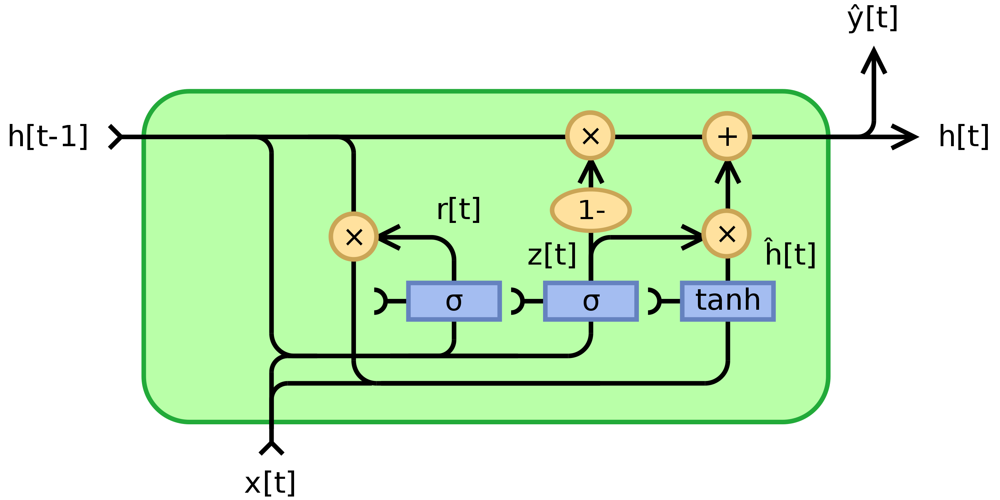

To learn more about GRU, please watch these short videos:

https://www.coursera.org/lecture/intro-to-deep-learning/modern-rnns-lstm-and-gru-WpduX

https://www.youtube.com/watch?v=pYRIOGTPRPU

Similar to the embedding layer, GRU module is not implemented in the Objax. The 

---

following is an implementation of the GRU cell in the Objax.

**Question 6[3 points]:** In the following implementation, complete the `__call__` function. 

In [ ]:
class GRU(objax.Module):
    def __init__(self, nin: int, nout: int,
                 init_w: Callable = objax.nn.init.xavier_truncated_normal,
                 init_b: Callable = objax.nn.init.truncated_normal):
        self.update_w = objax.TrainVar(init_w((nin, nout)))
        self.update_u = objax.TrainVar(init_w((nout, nout)))
        self.update_b = objax.TrainVar(init_b((nout,), stddev=0.01))
        self.reset_w = objax.TrainVar(init_w((nin, nout)))
        self.reset_u = objax.TrainVar(init_w((nout, nout)))
        self.reset_b = objax.TrainVar(init_b((nout,), stddev=0.01))
        self.output_w = objax.TrainVar(init_w((nin, nout)))
        self.output_u = objax.TrainVar(init_w((nout, nout)))
        self.output_b = objax.TrainVar(init_b((nout,), stddev=0.01))

    def __call__(self, x: JaxArray, initial_state: JaxArray) -> Tuple[JaxArray, JaxArray]:
        def scan_op(state: JaxArray, x: JaxArray) -> JaxArray:  # State must come first for lax.scan
            # fill this in
            update_gate = objax.functional.sigmoid(jn.matmul(x, self.update_w.value) + jn.matmul(state, self.update_u.value) + self.update_b.value) 
 
            # fill this in
            reset_gate = objax.functional.sigmoid(jn.matmul(x, self.reset_w.value) + jn.matmul(state, self.reset_u.value) + self.reset_b.value) 
            
            # fill this in
            output_gate = objax.functional.tanh(jn.matmul(x, self.output_w.value) + jn.matmul(jn.multiply(reset_gate, state), self.output_u.value) + self.output_b.value) 
            
            #return update_gate * state + (1 - update_gate) * output_gate, 0  # we don't use the output, return 0.
            return (1-update_gate) * state + (update_gate) * output_gate, 0   # we don't use the output, return 0.

        return lax.scan(scan_op, initial_state, x.transpose((1, 0, 2)))[0]

**Questions 7** (bonus)[5 points]: With an example, explain in detail what does lax.scan function do, and what it is useful for?

**The lax.scan function scans some function over leading array axis, while carrying along state information. We start with some intial state and our first input- input1. We perform some operation on the (initial state, input1) pair to get (new state, output1). The new state is then used in the next iteration (hence the term scan) to go from (new state, input2) to (another new state, output2). Obviously, in each iteration, both the new state and output are solely functions of old state and current input. This process continues till there is no more input to scan. When we pass input_state and an array of xs (if x is a matrix just loop through the leading array axis), we loop thorugh the xs and keep calculating an output each time while passing an updated state to the next iteration.** 

**As a simple example, observe how lax.scan function can be used to sum over elements in a list, as we usually do with a for loop. Say we have array \[1,2,3\]. If our scan operation is just output = current input + state, and we scan through the elements of the list form left to right, starting with initial state = initial sum = 0, we get \[1,2,3\] -> \[0+1, (0+1)+2, ((0+1)+2)+3\] = \[1,3,6\].**

**lax.scan is useful because it results in faster compile time for just-in-time compiled functions. This is because native Python for loops in a jit function are unrolled, which lends itself to larger accelerated linear algebra computations.** 

**It makes sense to use lax.scan in our implementation because each GRU cell taks in a state and input word, and returns an output and new state. Even though output for all but last cell are useless to us, this is still how its implemented, so we can take advantage of running time boost that lax.scan gives us**

**In our case, at very end it will give us an output and carry. The carry is what our final network output will be, so only return index 0 of the tuple that lax.scan returns**

**In our GRU network architecture, lax scan works bys scanning through the words of s sentence and passing new state from one GRU cell to next, till we get the final output. Since our function we use for training and evaluation are jit-compiled, they will run faster since the network has cycles that can benefit from accelerated computation**

# The classifier 

The structure of the proposed classifier is as follows:


*   The input is a vector whose elements are integers in the interval $\{$1,...,max_vocab$\}$ of length max_len. In fact input is the one-hot encoding of each review.
*    Then, the embedding layer converts this vector into a matrix of size (max_len,embedding_size).
* Then, we feed each row of this matrix into the GRU cell. The size of the output vector of the GRU is num_hidden_units_GRU.
*  The output of the GRU is feed into a fully-connected layer with num_hidden_units neurons and ReLU activation function.

* Finally, we have the output layer which is a fully-connected layer with two outputs corresponding to the positive or negative label.



**Question 8** [3 points]: implement the described classifier using `objax.nn.Sequential`.




In [ ]:
# fill this in: 
gru_rnn = objax.nn.Sequential([   
    Embed(max_vocab, embedding_size),   
    GRU(embedding_size, num_hidden_units_GRU),
    objax.nn.Linear(num_hidden_units_GRU, num_hidden_units),
    objax.functional.relu,
    objax.nn.Linear(num_hidden_units, 2)
])

You can print the structure as well as the number of the parameters of the each layer using the following line of codes.

In [ ]:
print(f'{" Network ":-^79}')
print(gru_rnn.vars())

----------------------------------- Network -----------------------------------
(Sequential)[0](Embed).w         60000 (2000, 30)
(Sequential)[1](GRU).update_w      900 (30, 30)
(Sequential)[1](GRU).update_u      900 (30, 30)
(Sequential)[1](GRU).update_b       30 (30,)
(Sequential)[1](GRU).reset_w       900 (30, 30)
(Sequential)[1](GRU).reset_u       900 (30, 30)
(Sequential)[1](GRU).reset_b        30 (30,)
(Sequential)[1](GRU).output_w      900 (30, 30)
(Sequential)[1](GRU).output_u      900 (30, 30)
(Sequential)[1](GRU).output_b       30 (30,)
(Sequential)[2](Linear).b           60 (60,)
(Sequential)[2](Linear).w         1800 (30, 60)
(Sequential)[4](Linear).b            2 (2,)
(Sequential)[4](Linear).w          120 (60, 2)
+Total(14)                       67472


**Question 9** [3 points]: Draw the classifier architecture diagram. For GRU consider drawing the unrolled version. You do not need to draw the internal structure of the GRU. 

**See attached pdf for drawing**

**Question 10**[1 point]: Construct an SGD optimizer using objax optimizers package.

In [ ]:
## Your implementaiton of the optimizer should go here
opt = objax.optimizer.SGD(gru_rnn.vars())

Then, we define the loss function, training operation function, and the
evaluation function.

In [ ]:
def loss_function(x: JaxArray, y: JaxArray):
    logits = gru_rnn(x, initial_state=jn.zeros((x.shape[0], num_hidden_units_GRU)))
    return objax.functional.loss.cross_entropy_logits_sparse(logits, y).sum()


gv = objax.GradValues(loss_function, gru_rnn.vars())


@objax.Function.with_vars(gv.vars() + opt.vars())
def train_op(x: JaxArray, y: JaxArray, lr: float):
    g, loss = gv(x, y)
    opt(lr, g)
    return loss


train_op = objax.Jit(train_op)
eval_op = objax.Jit(lambda x: gru_rnn(x, initial_state=jn.zeros((x.shape[0], num_hidden_units_GRU))),
                    gru_rnn.vars())


The next function is a helper for computing the accuracy.

In [ ]:
def accuracy(data_loader):
    """Compute the accuracy for a provided data loader"""
    acc_total = 0
    x, y = data_loader
    batch_size_acc = 500
    for batch_idx in np.array_split(np.arange(len(x)), len(x) // batch_size_acc):
        x_batch, target_class = x[batch_idx], y[batch_idx]
        predicted_class = eval_op(x_batch).argmax(1)
        acc_total += (predicted_class == target_class).sum()
    return acc_total / len(x)

**Question 11** [4 points]: Write the training loop to train the model. In each epoch, record the training accuracy and the validation accuracy. Also, at the end of the training report the accuracy on the test set. Please use the training set to train the model, the validation set to monitor accuracy during training, and then the test set once after training is complete to measure the final generalization of the model.

In [ ]:
learning_rate = 1e-3 # learning rate
num_epochs = 20 # number of epochs
batch_size = 250  # batch size

training_data = (messages_train, labels_train)
validation_data = (messages_valid, labels_valid)
test_data = (messages_test, labels_test)

In [ ]:
# you code for the training loop should start here 
def train(EPOCHS = 20, BATCH = 32, LEARNING_RATE = 9e-4):
  avg_train_loss_epoch = []
  avg_val_loss_epoch = [] 
  train_acc_epoch = [] 
  val_acc_epoch = []

  for epoch in range(EPOCHS):
      avg_train_loss = 0 # (averaged) training loss per batch
      avg_val_loss =  0  # (averaged) validation loss per batch
      train_acc = 0      # training accuracy per batch
      val_acc = 0        # validation accuracy per batch

      # shuffle the examples prior to training to remove correlation 
      train_indices = np.arange(len(messages_train)) 
      np.random.shuffle(train_indices)
      for it in range(0, messages_train.shape[0], BATCH):
          batch = train_indices[it:it+BATCH] # put code here
          avg_train_loss += float(train_op(messages_train[batch], labels_train[batch], LEARNING_RATE)[0]) * len(batch)
          train_prediction = eval_op(messages_train[batch]).argmax(1)
          train_acc += (np.array(train_prediction).flatten() == labels_train[batch]).sum()
      train_acc_epoch.append(train_acc/messages_train.shape[0])   
      avg_train_loss_epoch.append(avg_train_loss/messages_train.shape[0])

      # run validation
      val_indices = np.arange(len(messages_valid)) 
      np.random.shuffle(val_indices)    
      for it in range(0, messages_valid.shape[0], BATCH):
          batch = val_indices[it:it+BATCH] # put code here
          avg_val_loss += float(loss_function(messages_valid[batch], labels_valid[batch])) * len(batch) 
          val_prediction = eval_op(messages_valid[batch]).argmax(1)
          val_acc += (np.array(val_prediction).flatten() == labels_valid[batch]).sum()
      val_acc_epoch.append(val_acc/messages_valid.shape[0])
      avg_val_loss_epoch.append(avg_val_loss/messages_valid.shape[0])

      print('Epoch %04d  Training Loss %.2f Validation Loss %.2f Training Accuracy %.2f Validation Accuracy %.2f' % (epoch + 1, avg_train_loss/messages_train.shape[0], avg_val_loss/messages_valid.shape[0], 100*train_acc/messages_train.shape[0], 100*val_acc/messages_valid.shape[0]))
  
  #Plot training loss
  plt.title("Train vs Validation Loss")
  plt.plot(avg_train_loss_epoch, label="Train")
  plt.plot(avg_val_loss_epoch, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='best')
  plt.show()

  plt.title("Train vs Validation Accuracy")
  plt.plot(train_acc_epoch, label="Train")
  plt.plot(val_acc_epoch, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy (%)")
  plt.legend(loc='best')
  plt.show()

Epoch 0001  Training Loss 172.97 Validation Loss 172.33 Training Accuracy 54.15 Validation Accuracy 57.08
Epoch 0002  Training Loss 171.08 Validation Loss 169.04 Training Accuracy 58.13 Validation Accuracy 56.12
Epoch 0003  Training Loss 165.80 Validation Loss 164.23 Training Accuracy 60.96 Validation Accuracy 59.02
Epoch 0004  Training Loss 158.97 Validation Loss 156.71 Training Accuracy 64.64 Validation Accuracy 64.04
Epoch 0005  Training Loss 152.04 Validation Loss 184.14 Training Accuracy 67.86 Validation Accuracy 54.40
Epoch 0006  Training Loss 147.75 Validation Loss 139.82 Training Accuracy 70.30 Validation Accuracy 71.28
Epoch 0007  Training Loss 142.46 Validation Loss 176.91 Training Accuracy 71.19 Validation Accuracy 60.10
Epoch 0008  Training Loss 139.06 Validation Loss 148.64 Training Accuracy 72.83 Validation Accuracy 63.60
Epoch 0009  Training Loss 135.54 Validation Loss 138.97 Training Accuracy 73.91 Validation Accuracy 70.78
Epoch 0010  Training Loss 132.66 Validation Lo

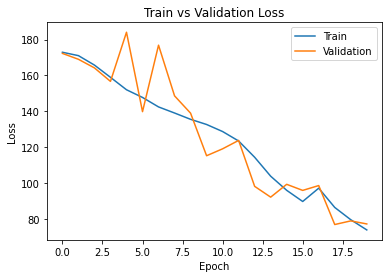

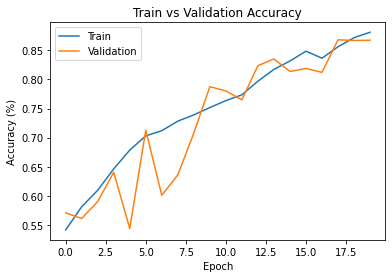

In [ ]:
train(num_epochs, batch_size, learning_rate)

In [ ]:
mean_test_loss = float(loss_function(messages_test, labels_test)) 
print('Mean Test Loss: %.2f' % (mean_test_loss))

test_prediction = eval_op(messages_test).argmax(1)
test_acc = ((np.array(test_prediction).flatten() == labels_test).sum())/labels_test.shape[0]
print('Test set accuracy: %.2f' % (test_acc*100))

Mean Test Loss: 1538.78
Test set accuracy: 86.50


**Question 12:[1 points]**  Plot the training accuracy and the validation accuracy versus the number of epochs. What is the generalization gap between the test and training?

**Plots of training accuracy and validation accuracy versus epochs are shown above.**

**From the training loop output, we have:\
Training Accuracy at end of training: 88.09%**

**Evaluating model on test set gave us:\
Accuracy on Test Set: 86.50%**

**Defining generalization gap between training and test as difference in percentage accuracy, we obtain:**\
**Generalization Gap = Training Accuracy - Test Accuracy = 88.09% - 86.50% = 1.59%**

# Comparing SGD with Adam

**Question 13** [4 points]: Train the same model with the same parameters using the Adam optimizer instead of the SGD. Do not forgot to initialize the network before training, otherwise the previous model will continue training from the final model parameters rather than start from a fresh set of random weight initialization values.

In [ ]:
# Define (again) your model here
gru_rnn2 = objax.nn.Sequential([
    Embed(max_vocab, embedding_size),   
    GRU(embedding_size, num_hidden_units_GRU),
    objax.nn.Linear(num_hidden_units_GRU, num_hidden_units),
    objax.functional.relu,
    objax.nn.Linear(num_hidden_units, 2)
])

In [ ]:
## Your implementaiton of the optimizer should go here
opt2 = objax.optimizer.Adam(gru_rnn2.vars())

You will also need the following functions.

In [ ]:
def loss_function(x: JaxArray, y: JaxArray):
    logits = gru_rnn2(x, initial_state=jn.zeros((x.shape[0], num_hidden_units_GRU)))
    return objax.functional.loss.cross_entropy_logits_sparse(logits, y).sum()


gv2 = objax.GradValues(loss_function, gru_rnn2.vars())


@objax.Function.with_vars(gv2.vars() + opt2.vars())
def train_op(x: JaxArray, y: JaxArray, lr: float):
    g, loss = gv2(x, y)
    opt2(lr, g)
    return loss


train_op = objax.Jit(train_op)
eval_op = objax.Jit(lambda x: gru_rnn2(x, initial_state=jn.zeros((x.shape[0], num_hidden_units_GRU))),
                    gru_rnn2.vars())

In [ ]:
learning_rate = 1e-3
num_epochs = 20
batch_size = 250 
training_data = (messages_train, labels_train)
validation_data = (messages_valid, labels_valid)
test_data = (messages_test, labels_test)

In [ ]:
# you code for the training loop should start here 
def train2(EPOCHS = 20, BATCH = 32, LEARNING_RATE = 9e-4):
  avg_train_loss_epoch = []
  avg_val_loss_epoch = [] 
  train_acc_epoch = [] 
  val_acc_epoch = []

  for epoch in range(EPOCHS):
      avg_train_loss = 0 # (averaged) training loss per batch
      avg_val_loss =  0  # (averaged) validation loss per batch
      train_acc = 0      # training accuracy per batch
      val_acc = 0        # validation accuracy per batch

      # shuffle the examples prior to training to remove correlation 
      train_indices = np.arange(len(messages_train)) 
      np.random.shuffle(train_indices)
      for it in range(0, messages_train.shape[0], BATCH):
          batch = train_indices[it:it+BATCH] # put code here
          avg_train_loss += float(train_op(messages_train[batch], labels_train[batch], LEARNING_RATE)[0]) * len(batch)
          train_prediction = eval_op(messages_train[batch]).argmax(1)
          train_acc += (np.array(train_prediction).flatten() == labels_train[batch]).sum()
      train_acc_epoch.append(train_acc/messages_train.shape[0])   
      avg_train_loss_epoch.append(avg_train_loss/messages_train.shape[0])

      # run validation
      val_indices = np.arange(len(messages_valid)) 
      np.random.shuffle(val_indices)    
      for it in range(0, messages_valid.shape[0], BATCH):
          batch = val_indices[it:it+BATCH] # put code here
          avg_val_loss += float(loss_function(messages_valid[batch], labels_valid[batch])) * len(batch) 
          val_prediction = eval_op(messages_valid[batch]).argmax(1)
          val_acc += (np.array(val_prediction).flatten() == labels_valid[batch]).sum()
      val_acc_epoch.append(val_acc/messages_valid.shape[0])
      avg_val_loss_epoch.append(avg_val_loss/messages_valid.shape[0])

      print('Epoch %04d  Training Loss %.2f Validation Loss %.2f Training Accuracy %.2f Validation Accuracy %.2f' % (epoch + 1, avg_train_loss/messages_train.shape[0], avg_val_loss/messages_valid.shape[0], 100*train_acc/messages_train.shape[0], 100*val_acc/messages_valid.shape[0]))
  
  #Plot training loss
  plt.title("Train vs Validation Loss")
  plt.plot(avg_train_loss_epoch, label="Train")
  plt.plot(avg_val_loss_epoch, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='best')
  plt.show()

  plt.title("Train vs Validation Accuracy")
  plt.plot(train_acc_epoch, label="Train")
  plt.plot(val_acc_epoch, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy (%)")
  plt.legend(loc='best')
  plt.show()

Epoch 0001  Training Loss 121.90 Validation Loss 82.52 Training Accuracy 76.00 Validation Accuracy 85.62
Epoch 0002  Training Loss 73.78 Validation Loss 75.33 Training Accuracy 88.39 Validation Accuracy 87.36
Epoch 0003  Training Loss 66.66 Validation Loss 68.91 Training Accuracy 89.54 Validation Accuracy 88.30
Epoch 0004  Training Loss 63.26 Validation Loss 69.86 Training Accuracy 90.25 Validation Accuracy 88.02
Epoch 0005  Training Loss 59.37 Validation Loss 72.93 Training Accuracy 90.95 Validation Accuracy 87.44
Epoch 0006  Training Loss 56.79 Validation Loss 71.61 Training Accuracy 91.41 Validation Accuracy 88.02
Epoch 0007  Training Loss 54.07 Validation Loss 72.88 Training Accuracy 92.00 Validation Accuracy 87.92
Epoch 0008  Training Loss 52.54 Validation Loss 73.91 Training Accuracy 92.26 Validation Accuracy 87.40
Epoch 0009  Training Loss 49.61 Validation Loss 75.45 Training Accuracy 92.76 Validation Accuracy 87.62
Epoch 0010  Training Loss 47.92 Validation Loss 78.25 Training 

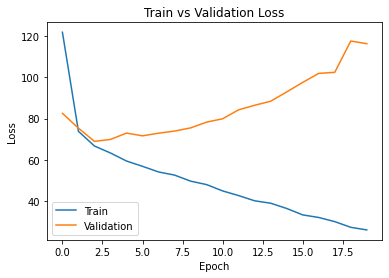

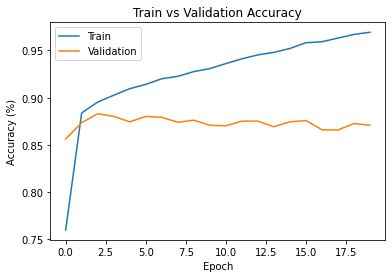

In [ ]:
train2(num_epochs, batch_size, learning_rate)

In [ ]:
mean_test_loss = float(loss_function(messages_test, labels_test)) 
print('Mean Test Loss: %.2f' % (mean_test_loss))

test_prediction = eval_op(messages_test).argmax(1)
test_acc = ((np.array(test_prediction).flatten() == labels_test).sum())/labels_test.shape[0]
print('Test set accuracy: %.2f' % (test_acc*100))

Mean Test Loss: 2326.83
Test set accuracy: 87.60


**Question 14** [1 points]: Plot the training accuracy and validation accuracy versus the epochs, and compare your results with the case that you trained the network using SGD. What is the generalization gap for this case?

**Plots of training accuracy and validation accuracy versus epochs are shown above.**

**From the training loop output, we have:\
Training Accuracy at end of training: 96.92%**

**Evaluating model on test set gave us:\
Accuracy on Test Set: 87.60%**

**Defining generalization gap between training and test as difference in percentage accuracy, we obtain:**\
**Generalization Gap = Training Accuracy - Test Accuracy = 96.92% - 87.60% = 9.32%**

**Comparing with the network trained using SGD, we have training accuracy of 96.92% instead of 88.09%. This is much higher (closer to 100). Furthermore, we have test set accuracy of 87.60% instead of 86.50%. This is higher, but not by much. This means with the new network trained using Adam optimizer, we are doing a really good job at fitting to the training data, with minimal benefits when generalizign to a test set. So, our model may be overfitting. To prevent overfitting while takign advantage of Adam optimizer's smaller number of epochs to reach same training accuracy as SGD, while maintaining around the same validation accuracy, we propose early stopping technique. This is explored below.**

**Questions 15** [1 points]: Briefly explain how Adam optimizer works and compare it with the SGD optimizaer.

**Adam optimizer is different from classical Stochastic Gradient Descent. In SGD, we maintain a single learning rate (lr/alpha) for all weight updates. This learning rate does not change at all durign training. The Adam optimizer is derived form adaptive moment estimation. The key idea is that it maintains a separate learning rate for each network weight/parameter, whichi is adapted during learning/training. Quoting from the paper this algorithm was introduced, "The method computes individual adaptive learning rates for different parameters from estimates of first and second moments of the gradients.".**

**So, Adam optimizer can be seen as an extension of Stochastic Gradient that combines benefits of two others extensions of SGD, namely
1) Adaptive Gradient Algorithm: this algorithm maintains one learning rate per weight/parameter. Experimentally, it has shown to work well on problems with sparse gradients, like natural language problems.
2) Root Mean Square Propagation: this algorithm also has one learning rate for each weight/parameter, updated based on average of recent magnitudes of gradients for the parameter (how quickly it is changing).** 

**Adam optimizer has benefits of both algorithm 1 and 2 above. 
Instead of just adapting based on average mean, as in Root Mean Square propagation, Adam also makes use of average of uncentered variance (second moments) of gradients.
Specifically, Adam calculates an exponential moving average of the gradient and squared gradient, with parameters beta_1 and beta_2 that control decay rates of these moving averages.**

**As seen in our training of both SGD and Adam-optimizer networks, Adam reached same val accuracy as SGD in much less number of steps. This is because of improvements in training procedure outlined above, it is able to converge to local/global minima faster and thus runnign for more epochs will only make it overfit to particular nuances it observes in the training data. In our specific task of sentiment analysis using our architecture (embedding layer, GRU Unit, etc), it seems like Adam is more efficient than SGD- it reaches the same generalization gap as SGD in fewer nubmer of epochs.**

**Overall, I think of Adam optimization as an improvement to SGD, as the cost of extra computations each step, and more hyperparameter tuning required to find best model. This is because in SGD, we take many noisy steps down cost function to reach a minimum. So, it is not as fast. Adam's implementation using momentum is like a ball rolling down a hill, instead of being random, gradients our learning rate depends on how fast our gradient is changing, so we move faster when we are starting off and slow down when we are closer to a minimum**

# Early Stopping

**Questions 16** [3 points]: 
This time implement the early stopping method with a patience window. All the parameters are the same as the previous section. Also, set the patience window to 5 epochs.

In [ ]:
# Your implementation of the model should go here
gru_rnn3 = objax.nn.Sequential([
    Embed(max_vocab, embedding_size),   
    GRU(embedding_size, num_hidden_units_GRU),
    objax.nn.Linear(num_hidden_units_GRU, num_hidden_units),
    objax.functional.relu,
    objax.nn.Linear(num_hidden_units, 2)
])

In [ ]:
## Your implementaiton of the optimizer should go here
opt3 = objax.optimizer.Adam(gru_rnn3.vars())

You will also need the following functions.

In [ ]:
def loss_function(x: JaxArray, y: JaxArray):
    logits = gru_rnn3(x, initial_state=jn.zeros((x.shape[0], num_hidden_units_GRU)))
    return objax.functional.loss.cross_entropy_logits_sparse(logits, y).sum()


gv3 = objax.GradValues(loss_function, gru_rnn3.vars())


@objax.Function.with_vars(gv3.vars() + opt3.vars())
def train_op(x: JaxArray, y: JaxArray, lr: float):
    g, loss = gv3(x, y)
    opt3(lr, g)
    return loss


train_op = objax.Jit(train_op)
eval_op = objax.Jit(lambda x: gru_rnn3(x, initial_state=jn.zeros((x.shape[0], num_hidden_units_GRU))),
                    gru_rnn3.vars())

In [ ]:
learning_rate = 1e-3
num_epochs = 20
batch_size = 250 
max_patience_window = 5
training_data = (messages_train, labels_train)
validation_data = (messages_valid, labels_valid)
test_data = (messages_test, labels_test)

In [ ]:
# you code for the training loop should start here 
# you code for the training loop should start here 
def train3(EPOCHS = 20, BATCH = 32, LEARNING_RATE = 9e-4):
  count = 0
  patience = 5
  avg_train_loss_epoch = []
  avg_val_loss_epoch = [] 
  train_acc_epoch = [] 
  val_acc_epoch = []

  for epoch in range(EPOCHS):
      avg_train_loss = 0 # (averaged) training loss per batch
      avg_val_loss =  0  # (averaged) validation loss per batch
      train_acc = 0      # training accuracy per batch
      val_acc = 0        # validation accuracy per batch

      # shuffle the examples prior to training to remove correlation 
      train_indices = np.arange(len(messages_train)) 
      np.random.shuffle(train_indices)
      for it in range(0, messages_train.shape[0], BATCH):
          batch = train_indices[it:it+BATCH] # put code here
          avg_train_loss += float(train_op(messages_train[batch], labels_train[batch], LEARNING_RATE)[0]) * len(batch)
          train_prediction = eval_op(messages_train[batch]).argmax(1)
          train_acc += (np.array(train_prediction).flatten() == labels_train[batch]).sum()
      train_acc_epoch.append(train_acc/messages_train.shape[0])   
      avg_train_loss_epoch.append(avg_train_loss/messages_train.shape[0])

      # run validation
      val_indices = np.arange(len(messages_valid)) 
      np.random.shuffle(val_indices)    
      for it in range(0, messages_valid.shape[0], BATCH):
          batch = val_indices[it:it+BATCH] # put code here
          avg_val_loss += float(loss_function(messages_valid[batch], labels_valid[batch])) * len(batch) 
          val_prediction = eval_op(messages_valid[batch]).argmax(1)
          val_acc += (np.array(val_prediction).flatten() == labels_valid[batch]).sum()
      val_acc_epoch.append(val_acc/messages_valid.shape[0])
      
      if avg_val_loss_epoch and avg_val_loss/messages_valid.shape[0] > avg_val_loss_epoch[-1]:
        count+=1
      else:
        count = 0
      if count == patience:
        break
      avg_val_loss_epoch.append(avg_val_loss/messages_valid.shape[0])

      print('Epoch %04d  Training Loss %.2f Validation Loss %.2f Training Accuracy %.2f Validation Accuracy %.2f Count %d' % (epoch + 1, avg_train_loss/messages_train.shape[0], avg_val_loss/messages_valid.shape[0], 100*train_acc/messages_train.shape[0], 100*val_acc/messages_valid.shape[0], count))
  
  #Plot training loss
  plt.title("Train vs Validation Loss")
  plt.plot(avg_train_loss_epoch, label="Train")
  plt.plot(avg_val_loss_epoch, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='best')
  plt.show()

  plt.title("Train vs Validation Accuracy")
  plt.plot(train_acc_epoch, label="Train")
  plt.plot(val_acc_epoch, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy (%)")
  plt.legend(loc='best')
  plt.show()

Epoch 0001  Training Loss 116.29 Validation Loss 76.84 Training Accuracy 77.66 Validation Accuracy 86.88 Count 0
Epoch 0002  Training Loss 72.81 Validation Loss 70.85 Training Accuracy 88.56 Validation Accuracy 87.74 Count 0
Epoch 0003  Training Loss 67.31 Validation Loss 72.86 Training Accuracy 89.44 Validation Accuracy 87.54 Count 1
Epoch 0004  Training Loss 63.56 Validation Loss 70.49 Training Accuracy 90.21 Validation Accuracy 87.86 Count 0
Epoch 0005  Training Loss 60.37 Validation Loss 69.33 Training Accuracy 90.75 Validation Accuracy 88.38 Count 0
Epoch 0006  Training Loss 58.07 Validation Loss 69.74 Training Accuracy 91.21 Validation Accuracy 87.86 Count 1
Epoch 0007  Training Loss 55.03 Validation Loss 70.07 Training Accuracy 91.57 Validation Accuracy 87.94 Count 2
Epoch 0008  Training Loss 52.33 Validation Loss 74.40 Training Accuracy 92.12 Validation Accuracy 87.84 Count 3
Epoch 0009  Training Loss 50.27 Validation Loss 78.18 Training Accuracy 92.53 Validation Accuracy 87.46

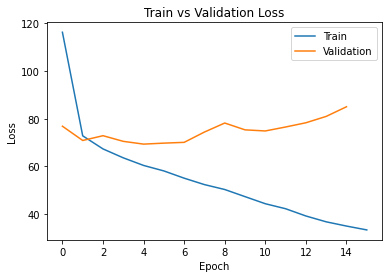

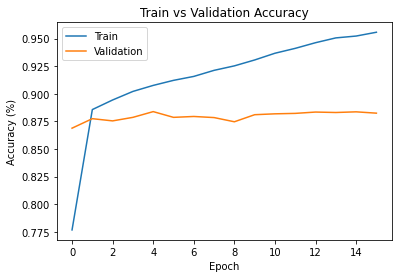

In [ ]:
train3(num_epochs, batch_size, learning_rate)

In [ ]:
mean_test_loss = float(loss_function(messages_test, labels_test)) 
print('Mean Test Loss: %.2f' % (mean_test_loss))

test_prediction = eval_op(messages_test).argmax(1)
test_acc = ((np.array(test_prediction).flatten() == labels_test).sum())/labels_test.shape[0]
print('Test set accuracy: %.2f' % (test_acc*100))

Mean Test Loss: 1736.08
Test set accuracy: 88.18


**Question 16**[1 points]: Report the best validation accuracy and the test accuracy of your best model.

**Summarizing all our models, we have:**     
**SGD:**
Training Accuracy: 88.09%
Validation Accuracy: 86.72% 
Test Accuracy: **86.50%**

**Adam:**
Training Accuracy: 96.92%
Validation Accuracy: 87.08% 
Test Accuracy: **87.60%**

**Adam with Early Stopping:**     
Training Accuracy: 95.23%
Validation Accuracy: 88.36% 
Test Accuracy: **88.18%**

We want our best model to be the one that best generalizes to new data. So, we select Adam optimizer with early stopping, since it achieves the highest test error, and test set is the only set from \{training, test, validation\} that is not used during learning. **Thus, the best validation accuracy and test accuracy of my best model is 88.36% and 88.18%, respectively. The best validation accuracy occurs in the last epoch.**